In [11]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd

import_path = Path.cwd().parent.parent
os.sys.path.insert(0, str(import_path))
import feature_utils as futils

In [2]:
data_path = r"D:\segs_clust_5762"

In [3]:
root = Path(data_path)  # <- change this

seg = np.load(root / "segments_ipca.npz")
cfg = np.load(root / "config_and_ipca.npz")

print("segments_ipca keys:", seg.files)
print("config_and_ipca keys:", cfg.files)

ipca_components = seg["ipca_components"]
ipca_mean = seg["ipca_mean"]
scaler_mean = seg["scaler_mean"]
scaler_scale = seg["scaler_scale"]
evr = seg["explained_variance_ratio"]
n_components = int(seg["n_components"])

print("ipca_components.shape:", ipca_components.shape)
print("ipca_mean.shape:", ipca_mean.shape)
print("scaler_mean.shape:", scaler_mean.shape)
print("scaler_scale.shape:", scaler_scale.shape)
print("n_components:", n_components)
print("sum(explained_variance_ratio):", evr.sum())
print("any NaN in ipca_components?", np.isnan(ipca_components).any())
print("any NaN in scaler_mean?", np.isnan(scaler_mean).any())
print("any NaN in scaler_scale?", np.isnan(scaler_scale).any())


segments_ipca keys: ['ipca_components', 'ipca_mean', 'scaler_mean', 'scaler_scale', 'explained_variance', 'explained_variance_ratio', 'n_components']
config_and_ipca keys: ['ipca_components', 'ipca_mean', 'scaler_mean', 'scaler_scale', 'explained_variance', 'explained_variance_ratio', 'segment_sec', 'clip_sec', 'mels_start', 'mels_end', 'downsample_target', 'n_mels', 'n_components']
ipca_components.shape: (8192, 15300)
ipca_mean.shape: (15300,)
scaler_mean.shape: (15300,)
scaler_scale.shape: (15300,)
n_components: 8192
sum(explained_variance_ratio): 0.99753094
any NaN in ipca_components? False
any NaN in scaler_mean? False
any NaN in scaler_scale? False


In [4]:
k_dir = Path(r"D:\segs_clust_5762\pc_8192\k_08")

summary_path = k_dir / "kmeans_summary.npz"
centers_path = k_dir / "kmeans_centers.npy"

if summary_path.exists():
    summ = np.load(summary_path)
    print("kmeans_summary keys:", summ.files)
    k = int(summ["k"])
    inertia = float(summ["inertia"])
    sil = float(summ["silhouette"])
    n_pc = int(summ["n_pc"])
    print(f"k = {k}, n_pc = {n_pc}")
    print(f"inertia = {inertia:.3e}")
    print(f"silhouette = {sil}")

if centers_path.exists():
    centers = np.load(centers_path)
    print("centers.shape:", centers.shape)


kmeans_summary keys: ['k', 'inertia', 'silhouette', 'n_pc']
k = 8, n_pc = 8192
inertia = 6.432e+07
silhouette = 0.47291597723960876
centers.shape: (8, 8192)


In [5]:
labels_path = k_dir / "segment_labels.npy"
dist2_path = k_dir / "segment_dist2.npy"
meta_path = k_dir / "segment_meta.npy"

for p in [labels_path, dist2_path, meta_path]:
    print(p.name, "exists?", p.exists())

if labels_path.exists():
    labels = np.load(labels_path, mmap_mode="r")
    print("labels.shape:", labels.shape, "dtype:", labels.dtype)

if dist2_path.exists():
    dist2 = np.load(dist2_path, mmap_mode="r")
    print("dist2.shape:", dist2.shape, "dtype:", dist2.dtype)

if meta_path.exists():
    meta = np.load(meta_path, mmap_mode="r")
    print("meta.shape:", meta.shape, "dtype:", meta.dtype)
    # peek at first few entries
    print(meta[:3])

segment_labels.npy exists? True
segment_dist2.npy exists? True
segment_meta.npy exists? True
labels.shape: (653130,) dtype: int32
dist2.shape: (653130,) dtype: float32
meta.shape: (653130,) dtype: [('file_path', '<U256'), ('segment_idx', '<i4'), ('start_frame', '<i4'), ('end_frame', '<i4')]
[('/home/trh104/second_extraction/Aug_6229/6229.220802122000.npz', 0,    0,  613)
 ('/home/trh104/second_extraction/Aug_6229/6229.220802122000.npz', 1,  613, 1226)
 ('/home/trh104/second_extraction/Aug_6229/6229.220802122000.npz', 2, 1226, 1839)]


In [ ]:
pc_dir = k_dir.parent # ...\pc_8192
Z_opt_path = pc_dir / "pca_scores.npy"
Z2_path = pc_dir / "pca2_scores.npy"

print("pca_scores exists?", Z_opt_path.exists())
print("pca2_scores exists?", Z2_path.exists())

if Z_opt_path.exists():
    Z_opt = np.load(Z_opt_path, mmap_mode="r")
    print("Z_opt.shape:", Z_opt.shape)

if Z2_path.exists():
    Z2 = np.load(Z2_path, mmap_mode="r")
    print("Z2.shape:", Z2.shape)

pca_scores exists? False
pca2_scores exists? False


In [7]:
OUT_DIR = Path(data_path)
FEATURE_ROOT = None 

N_SAMPLES = 80_000  # Segments to sample for PCA(2).

Loaded PCA + scaler
ipca_components: (8192, 15300)
ipca_mean      : (15300,)
scaler_mean    : (15300,)
scaler_scale   : (15300,)
Feature dimension D: 15300
Found 12095 feature files in all_paths.npy
X_sample shape: (80000, 15300)
Number of meta entries: 80000
Z2 shape: (80000, 2)


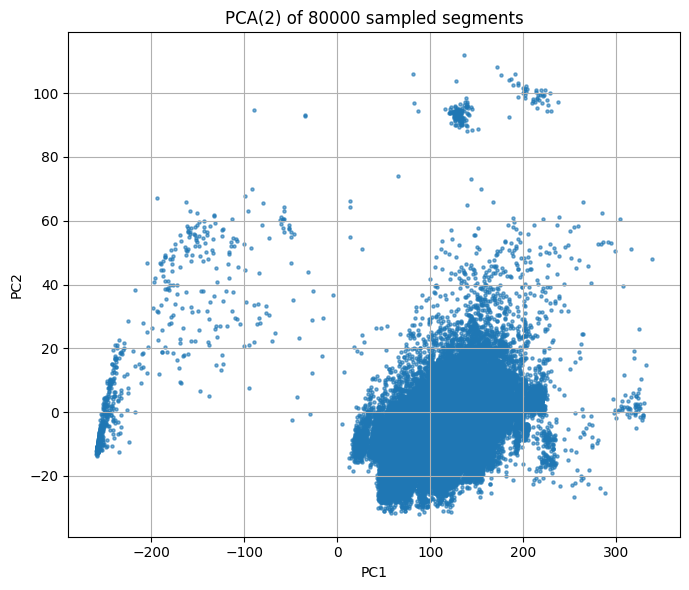

In [8]:
# Load PCA + scaler from config_and_ipca.npz.
cfg = np.load(OUT_DIR / "config_and_ipca.npz")

ipca_components = cfg["ipca_components"]   # (max_pc, D)
ipca_mean       = cfg["ipca_mean"]         # (D,)
scaler_mean     = cfg["scaler_mean"]       # (D,)
scaler_scale    = cfg["scaler_scale"]      # (D,)

segment_sec     = float(cfg["segment_sec"])
clip_sec        = float(cfg["clip_sec"])
mels_start      = int(cfg["mels_start"])
mels_end        = int(cfg["mels_end"])
downsample_T    = int(cfg["downsample_target"])

print("Loaded PCA + scaler")
print("ipca_components:", ipca_components.shape)
print("ipca_mean      :", ipca_mean.shape)
print("scaler_mean    :", scaler_mean.shape)
print("scaler_scale   :", scaler_scale.shape)

D = scaler_mean.shape[0]
print("Feature dimension D:", D)

# Helper: PCA transform to any # of PCs (using saved matrices).

def T_any(Xb: np.ndarray, n_pc: int) -> np.ndarray:
    """
    Xb: (B, D) batch of flattened segments.
    Returns: (B, n_pc) PCA projection using saved scaler + IPCA.
    """
    Xb_sc = (Xb - scaler_mean) / scaler_scale
    Z = (Xb_sc - ipca_mean) @ ipca_components[:n_pc].T
    return Z.astype(np.float32, copy=False)

# Load the list of feature files used for training.

root_dir = Path(r"D:\second_extraction")
all_paths = np.load(OUT_DIR / "all_paths.npy", allow_pickle=True)

files = []
for s in all_paths:
    s = str(s)
    token = "second_extraction"
    i = s.rfind(token)
    if i == -1:
        # fallback: just take the basename if pattern not found
        rel = Path(s).name
    else:
        # everything after "second_extraction/"
        rel = s[i + len(token) + 1:]
    files.append(root_dir / rel)


print(f"Found {len(files)} feature files in all_paths.npy")

def stream_segments_sample(files, n_samples: int,
                           segment_sec: float = 5.0,
                           clip_sec: float = 270.0,
                           mels_start: int = 9, mels_end: int = 60,
                           downsample_T: int = 300,
                           key: str = "feature"):
    """
    Stream segments from the .npz feature files until we have n_samples.
    Returns:
      X: (n_samples, D) array
      meta: list of meta dicts
    """
    xs = []
    meta = []

    for fp in files:
        with np.load(fp, mmap_mode="r") as z:
            if key not in z.files:
                continue
            s = np.squeeze(z[key])
            if s.ndim != 2:
                continue

            # s: (M_full, T_full)
            M_full, T_full = s.shape
            s = s[mels_start:mels_end, :]  # drop low mel bins
            M, T = s.shape

            frames_per_segment = int(round(T * (segment_sec / clip_sec)))
            if frames_per_segment <= 0 or frames_per_segment > T:
                continue

            seg_idx = 0
            for start in range(0, T - frames_per_segment + 1, frames_per_segment):
                end = start + frames_per_segment
                seg = s[:, start:end]  # (M, frames_per_segment)

                # Downsample in time using the same function as on Slurm:
                seg_ds = futils.downsample_time_avgpool_from_db(
                    seg, T_target=downsample_T, ref=1.0
                ).numpy()  # (M, downsample_T)

                v = seg_ds.astype(np.float32, copy=False).ravel()[None, :]  # (1, D)

                xs.append(v)
                meta.append(dict(
                    file_path=str(fp),
                    segment_idx=seg_idx,
                    start_frame=int(start),
                    end_frame=int(end),
                ))

                seg_idx += 1

                if len(xs) >= n_samples:
                    X = np.vstack(xs)
                    return X, meta

    # If we ran out of segments before n_samples
    if xs:
        X = np.vstack(xs)
    else:
        X = np.empty((0, D), dtype=np.float32)
    return X, meta

# Sample segments and project to PCA(2)
X_sample, meta_sample = stream_segments_sample(
    files,
    n_samples=N_SAMPLES,
    segment_sec=segment_sec,
    clip_sec=clip_sec,
    mels_start=mels_start,
    mels_end=mels_end,
    downsample_T=downsample_T,
)

print("X_sample shape:", X_sample.shape)
print("Number of meta entries:", len(meta_sample))

if X_sample.shape[0] == 0:
    raise RuntimeError("No segments were loaded; check paths & parameters.")

Z2 = T_any(X_sample, 2)   # (N_samples, 2)
print("Z2 shape:", Z2.shape)

# Plot 2D PCA space
plt.figure(figsize=(7, 6))
plt.scatter(Z2[:, 0], Z2[:, 1], s=5, alpha=0.6)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title(f"PCA(2) of {Z2.shape[0]} sampled segments")
plt.grid(True)
plt.tight_layout()
plt.show()


In [10]:
save_path = Path(r"D:\segs_clust_5762\research") / f"sample_pca2_{N_SAMPLES}_segments.npz"

file_path_arr  = np.array([m["file_path"]  for m in meta_sample], dtype=object)
segment_idx_arr = np.array([m["segment_idx"] for m in meta_sample], dtype=np.int32)
start_frame_arr = np.array([m["start_frame"] for m in meta_sample], dtype=np.int32)
end_frame_arr   = np.array([m["end_frame"]   for m in meta_sample], dtype=np.int32)

np.savez_compressed(
    save_path,
    Z2=Z2.astype(np.float32),
    file_path=file_path_arr,
    segment_idx=segment_idx_arr,
    start_frame=start_frame_arr,
    end_frame=end_frame_arr,
)

### Top segments in n_components = 8192 and k = 8

In [ ]:
# Load k-means results and meta
centers = np.load(k_dir / "kmeans_centers.npy")              # (k, n_pc)
summary = np.load(k_dir / "kmeans_summary.npz")

labels  = np.load(k_dir / "segment_labels.npy", mmap_mode="r")
dist2   = np.load(k_dir / "segment_dist2.npy", mmap_mode="r")
meta    = np.load(k_dir / "segment_meta.npy", mmap_mode="r")  # structured array

k = centers.shape[0]
print(f"k = {k}")
print("centers.shape:", centers.shape)
print("labels.shape :", labels.shape)
print("dist2.shape  :", dist2.shape)
print("meta.shape   :", meta.shape)

# Load nearest_segments.csv and parse feature_segment
# Format: cluster,rank,dist2,feature_segment
# where feature_segment = "<file_path>#seg<segment_idx>"
nearest_df = pd.read_csv(k_dir / "nearest_segments.csv")
print(nearest_df.head())

# Parse file_path and segment_idx out of 'feature_segment'
fs_split = nearest_df["feature_segment"].str.split("#seg", n=1, expand=True)
nearest_df["file_path"]   = fs_split[0]
nearest_df["segment_idx"] = fs_split[1].astype(int)

# Turn segment_meta.npy into a DataFrame for joining
meta_df = pd.DataFrame({
    "file_path":   meta["file_path"],
    "segment_idx": meta["segment_idx"],
    "start_frame": meta["start_frame"],
    "end_frame":   meta["end_frame"],
})

# Join to add start/end frames to the nearest list
nearest_merged = nearest_df.merge(
    meta_df,
    on=["file_path", "segment_idx"],
    how="left",
)

# Show top 10 segments per cluster
for j in range(k):
    print(f"\n=== Cluster {j} ===")
    top10 = (
        nearest_merged[nearest_merged["cluster"] == j]
        .sort_values("rank")
        .head(10)
        [["cluster", "rank", "dist2", "file_path",
          "segment_idx", "start_frame", "end_frame"]]
    )
    display(top10)


k = 8
centers.shape: (8, 8192)
labels.shape : (653130,)
dist2.shape  : (653130,)
meta.shape   : (653130,)
   cluster  rank       dist2  \
0        0     1  575.117188   
1        0     2  577.480469   
2        0     3  577.589844   
3        0     4  579.964844   
4        0     5  580.738281   

                                     feature_segment  
0  /home/trh104/second_extraction/Aug_6229/6229.2...  
1  /home/trh104/second_extraction/Aug_6229/6229.2...  
2  /home/trh104/second_extraction/Aug_6229/6229.2...  
3  /home/trh104/second_extraction/Aug_6229/6229.2...  
4  /home/trh104/second_extraction/Aug_6229/6229.2...  

=== Cluster 0 ===


,cluster,rank,dist2,file_path,segment_idx,start_frame,end_frame
0,0,1,575.117188,/home/trh104/second_extraction/Aug_6229/6229.2...,43,26359,26972
1,0,2,577.480469,/home/trh104/second_extraction/Aug_6229/6229.2...,50,30650,31263
2,0,3,577.589844,/home/trh104/second_extraction/Aug_6229/6229.2...,50,30650,31263
3,0,4,579.964844,/home/trh104/second_extraction/Aug_6229/6229.2...,20,12260,12873
4,0,5,580.738281,/home/trh104/second_extraction/Aug_6229/6229.2...,35,21455,22068
5,0,6,581.332031,/home/trh104/second_extraction/Aug_6229/6229.2...,28,17164,17777
6,0,7,585.136719,/home/trh104/second_extraction/Aug_6229/6229.2...,38,23294,23907
7,0,8,585.339844,/home/trh104/second_extraction/Aug_6229/6229.2...,15,9195,9808
8,0,9,585.800781,/home/trh104/second_extraction/Aug_6229/6229.2...,50,30650,31263
9,0,10,587.312500,/home/trh104/second_extraction/Aug_6229/6229.2...,4,2452,3065



=== Cluster 1 ===


,cluster,rank,dist2,file_path,segment_idx,start_frame,end_frame
500,1,1,672.505127,/home/trh104/second_extraction/Tracy_6230/6230...,31,19003,19616
501,1,2,689.595947,/home/trh104/second_extraction/Tracy_6230/6230...,9,5517,6130
502,1,3,705.999023,/home/trh104/second_extraction/Tracy_6230/6230...,11,6743,7356
503,1,4,714.575562,/home/trh104/second_extraction/Tracy_6230/6230...,9,5517,6130
504,1,5,717.372803,/home/trh104/second_extraction/Tracy_6230/6230...,45,27585,28198
505,1,6,719.958374,/home/trh104/second_extraction/Tracy_6230/6230...,51,31263,31876
506,1,7,723.192871,/home/trh104/second_extraction/Tracy_6230/6230...,2,1226,1839
507,1,8,733.613770,/home/trh104/second_extraction/Tracy_6230/6230...,13,7969,8582
508,1,9,737.416138,/home/trh104/second_extraction/Tracy_6230/6230...,41,25133,25746
509,1,10,749.339722,/home/trh104/second_extraction/Tracy_6230/6230...,20,12260,12873



=== Cluster 2 ===


,cluster,rank,dist2,file_path,segment_idx,start_frame,end_frame
1000,2,1,704.171875,/home/trh104/second_extraction/Aug_6229/6229.2...,52,31876,32489
1001,2,2,709.369141,/home/trh104/second_extraction/Aug_6229/6229.2...,11,6743,7356
1002,2,3,719.279297,/home/trh104/second_extraction/Aug_6229/6229.2...,48,29424,30037
1003,2,4,722.554688,/home/trh104/second_extraction/Tracy_6230/6230...,20,12260,12873
1004,2,5,723.605469,/home/trh104/second_extraction/Sep_6229/6229.2...,52,31876,32489
1005,2,6,723.941406,/home/trh104/second_extraction/Tracy_6230/6230...,40,24520,25133
1006,2,7,726.355469,/home/trh104/second_extraction/Aug_6229/6229.2...,32,19616,20229
1007,2,8,726.964844,/home/trh104/second_extraction/Aug_6229/6229.2...,33,20229,20842
1008,2,9,731.310547,/home/trh104/second_extraction/Aug_6229/6229.2...,42,25746,26359
1009,2,10,736.025391,/home/trh104/second_extraction/Aug_6229/6229.2...,13,7969,8582



=== Cluster 3 ===


,cluster,rank,dist2,file_path,segment_idx,start_frame,end_frame
1500,3,1,599.298828,/home/trh104/second_extraction/Sep_6229/6229.2...,32,19616,20229
1501,3,2,601.537109,/home/trh104/second_extraction/Tracy_6230/6230...,17,10421,11034
1502,3,3,620.060547,/home/trh104/second_extraction/Tracy_6230/6230...,27,16551,17164
1503,3,4,623.171875,/home/trh104/second_extraction/Tracy_6230/6230...,7,4291,4904
1504,3,5,625.945312,/home/trh104/second_extraction/Sep_6229/6229.2...,9,5517,6130
1505,3,6,626.619141,/home/trh104/second_extraction/Tracy_6230/6230...,23,14099,14712
1506,3,7,627.355469,/home/trh104/second_extraction/Sep_6229/6229.2...,32,19616,20229
1507,3,8,628.312500,/home/trh104/second_extraction/Tracy_6230/6230...,51,31263,31876
1508,3,9,628.339844,/home/trh104/second_extraction/Tracy_6230/6230...,1,613,1226
1509,3,10,630.128906,/home/trh104/second_extraction/Sep_6229/6229.2...,39,23907,24520



=== Cluster 4 ===


,cluster,rank,dist2,file_path,segment_idx,start_frame,end_frame
2000,4,1,693.860352,/home/trh104/second_extraction/Tracy_6230/6230...,28,17164,17777
2001,4,2,703.752930,/home/trh104/second_extraction/Tracy_6230/6230...,35,21455,22068
2002,4,3,709.340820,/home/trh104/second_extraction/Tracy_6230/6230...,20,12260,12873
2003,4,4,714.229492,/home/trh104/second_extraction/Tracy_6230/6230...,52,31876,32489
2004,4,5,716.691406,/home/trh104/second_extraction/Tracy_6230/6230...,14,8582,9195
2005,4,6,717.340820,/home/trh104/second_extraction/Tracy_6230/6230...,43,26359,26972
2006,4,7,719.947266,/home/trh104/second_extraction/Tracy_6230/6230...,44,26972,27585
2007,4,8,721.337891,/home/trh104/second_extraction/Tracy_6230/6230...,24,14712,15325
2008,4,9,723.762695,/home/trh104/second_extraction/Tracy_6230/6230...,2,1226,1839
2009,4,10,725.045898,/home/trh104/second_extraction/Tracy_6230/6230...,18,11034,11647



=== Cluster 5 ===


,cluster,rank,dist2,file_path,segment_idx,start_frame,end_frame
2500,5,1,791.296875,/home/trh104/second_extraction/Tracy_6230/6230...,43,26359,26972
2501,5,2,845.460938,/home/trh104/second_extraction/Tracy_6230/6230...,6,3678,4291
2502,5,3,850.304688,/home/trh104/second_extraction/Tracy_6230/6230...,27,16551,17164
2503,5,4,853.156250,/home/trh104/second_extraction/Tracy_6230/6230...,14,8582,9195
2504,5,5,854.828125,/home/trh104/second_extraction/Tracy_6230/6230...,32,19616,20229
2505,5,6,858.406250,/home/trh104/second_extraction/Tracy_6230/6230...,0,0,613
2506,5,7,859.343750,/home/trh104/second_extraction/Tracy_6230/6230...,41,25133,25746
2507,5,8,859.781250,/home/trh104/second_extraction/Tracy_6230/6230...,8,4904,5517
2508,5,9,872.851562,/home/trh104/second_extraction/Tracy_6230/6230...,42,25746,26359
2509,5,10,873.468750,/home/trh104/second_extraction/Tracy_6230/6230...,21,12873,13486



=== Cluster 6 ===


,cluster,rank,dist2,file_path,segment_idx,start_frame,end_frame
3000,6,1,618.053711,/home/trh104/second_extraction/Tracy_6230/6230...,38,23294,23907
3001,6,2,618.235840,/home/trh104/second_extraction/Tracy_6230/6230...,15,9195,9808
3002,6,3,620.671387,/home/trh104/second_extraction/Tracy_6230/6230...,50,30650,31263
3003,6,4,630.768555,/home/trh104/second_extraction/Tracy_6230/6230...,27,16551,17164
3004,6,5,631.255859,/home/trh104/second_extraction/Tracy_6230/6230...,47,28811,29424
3005,6,6,632.523438,/home/trh104/second_extraction/Tracy_6230/6230...,49,30037,30650
3006,6,7,633.000000,/home/trh104/second_extraction/Tracy_6230/6230...,29,17777,18390
3007,6,8,639.071289,/home/trh104/second_extraction/Tracy_6230/6230...,28,17164,17777
3008,6,9,639.438477,/home/trh104/second_extraction/Tracy_6230/6230...,46,28198,28811
3009,6,10,641.785156,/home/trh104/second_extraction/Tracy_6230/6230...,7,4291,4904



=== Cluster 7 ===


,cluster,rank,dist2,file_path,segment_idx,start_frame,end_frame
3500,7,1,584.300781,/home/trh104/second_extraction/Tracy_6230/6230...,38,23294,23907
3501,7,2,584.642578,/home/trh104/second_extraction/Aug_6229/6229.2...,4,2452,3065
3502,7,3,586.607422,/home/trh104/second_extraction/Tracy_6230/6230...,2,1226,1839
3503,7,4,587.714844,/home/trh104/second_extraction/Aug_6229/6229.2...,3,1839,2452
3504,7,5,591.056641,/home/trh104/second_extraction/Aug_6229/6229.2...,24,14712,15325
3505,7,6,598.873047,/home/trh104/second_extraction/Tracy_6230/6230...,50,30650,31263
3506,7,7,599.177734,/home/trh104/second_extraction/Aug_6229/6229.2...,32,19616,20229
3507,7,8,599.318359,/home/trh104/second_extraction/Aug_6229/6229.2...,30,18390,19003
3508,7,9,599.355469,/home/trh104/second_extraction/Aug_6229/6229.2...,7,4291,4904
3509,7,10,602.695312,/home/trh104/second_extraction/Aug_6229/6229.2...,27,16551,17164


In [28]:
# nearest_merged.query("file_path == 'second_extraction/Tracy_6230/6230.220917120000'")
search_rows = nearest_merged[nearest_merged["file_path"].str.contains(
    "220917120000", na=False
)]
search_rows

,cluster,rank,dist2,feature_segment,file_path,segment_idx,start_frame,end_frame


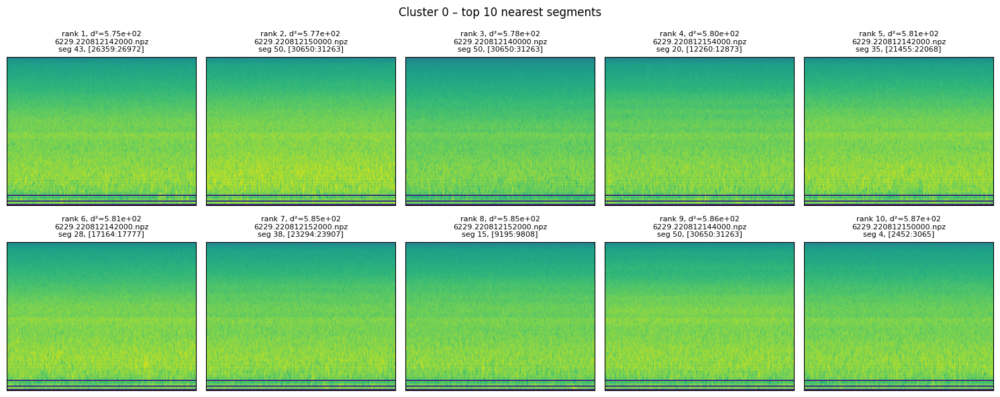

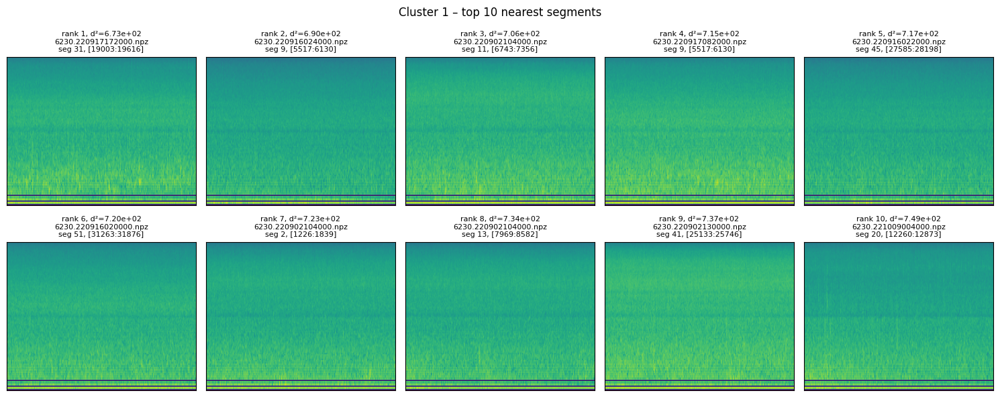

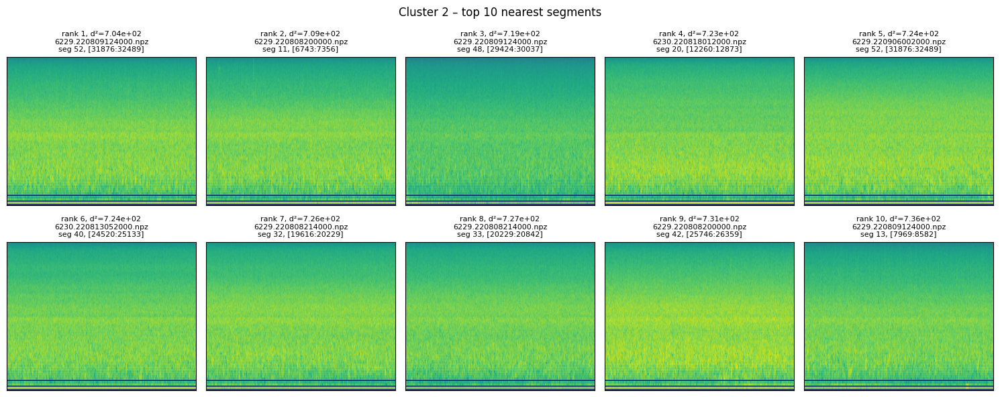

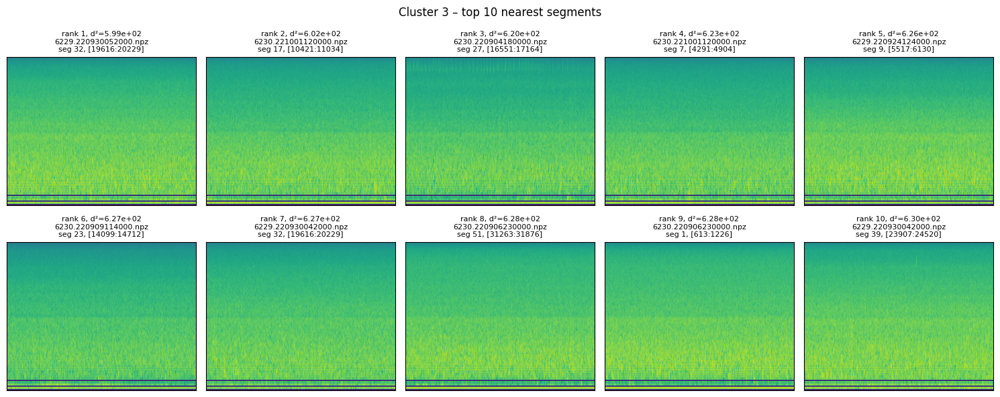

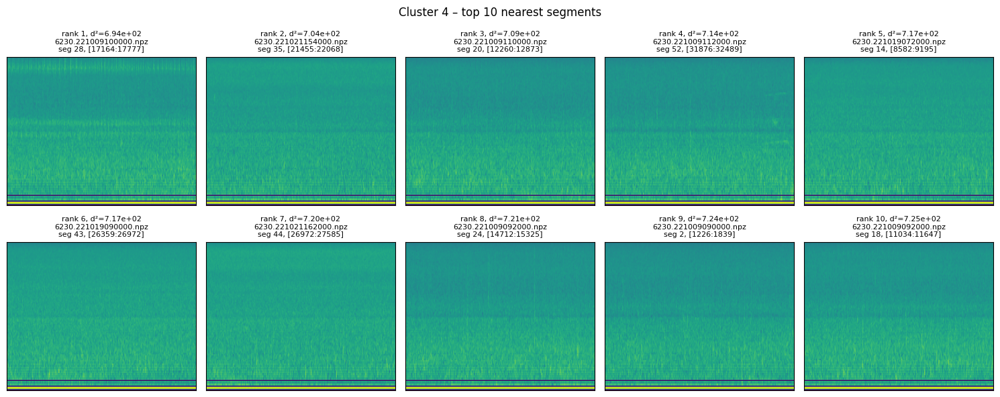

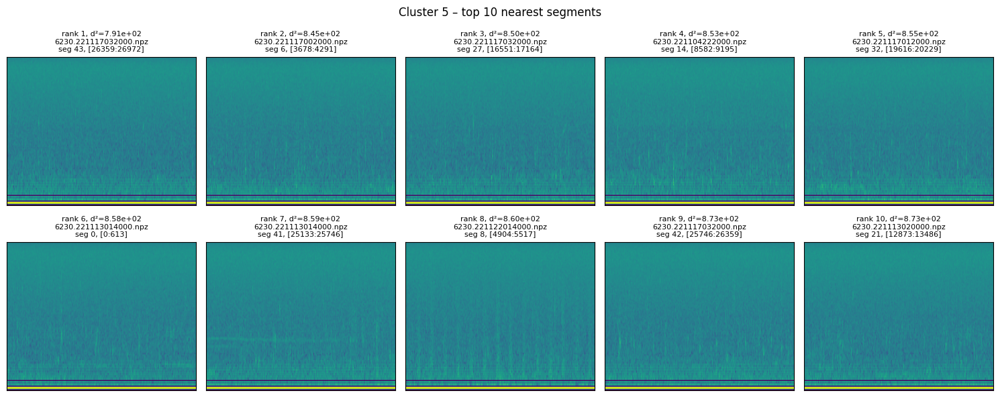

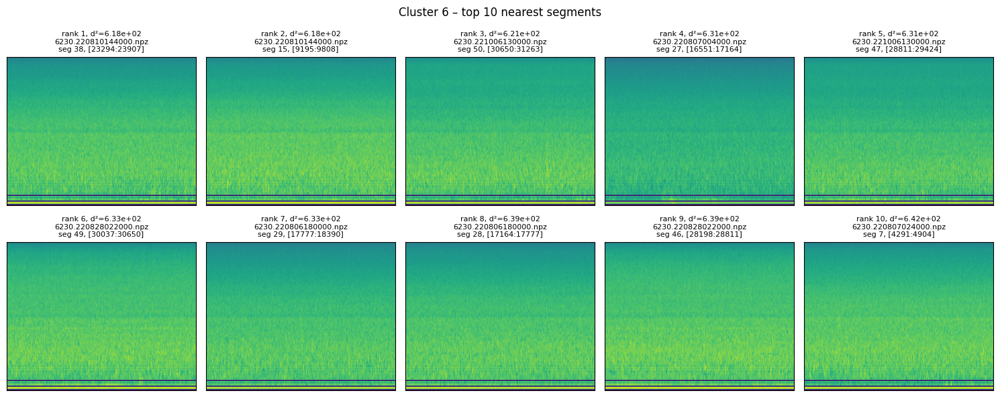

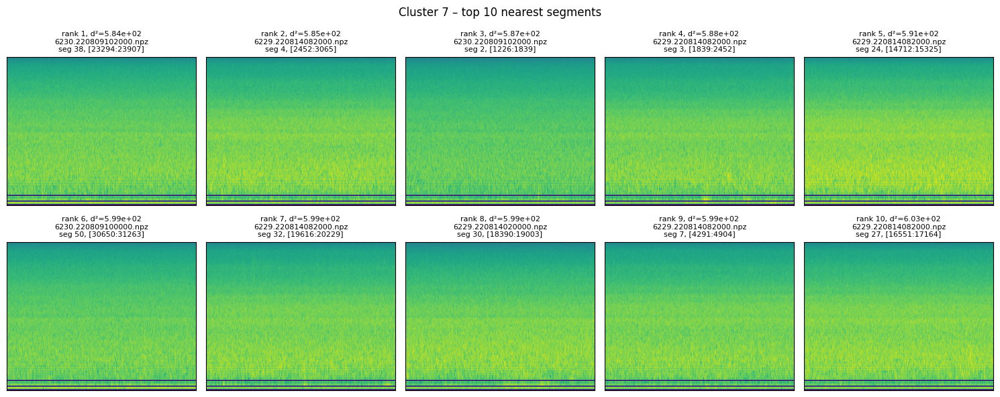

In [ ]:
def map_to_local(slurm_path: str, data_root: Path, token: str = "second_extraction") -> Path:
    """
    Re-root a Slurm absolute path under the local data_root, preserving
    the subtree under 'token' (default: 'second_extraction').
    """
    s = str(slurm_path)
    i = s.rfind(token)
    if i == -1:
        # Fallback: just use basename if pattern not found
        return data_root / Path(s).name
    rel = s[i + len(token) + 1:]  # part after 'second_extraction/'
    return data_root / rel

# -----------------------------------------------------------
# Main plotting function
# -----------------------------------------------------------
def plot_top_spectrograms_per_cluster(
    out_dir: Path,
    data_root: Path,
    pc: int = 8192,
    k: int = 8,
    n_top: int = 20,
    key: str = "feature",
):
    """
    For each cluster (0..k-1), plot the top n_top nearest segments
    using the original spectrogram features from local disk.
    """
    out_dir = Path(out_dir)
    data_root = Path(data_root)

    pc_dir = out_dir / f"pc_{pc}"
    k_dir = pc_dir / f"k_{k:02d}"

    # --- load config to get segmentation parameters ---
    cfg = np.load(out_dir / "config_and_ipca.npz")
    segment_sec = float(cfg["segment_sec"])
    clip_sec    = float(cfg["clip_sec"])

    # --- load meta + nearest segments ---
    meta = np.load(k_dir / "segment_meta.npy", mmap_mode="r")
    meta_df = pd.DataFrame({
        "file_path":   meta["file_path"],
        "segment_idx": meta["segment_idx"],
        "start_frame": meta["start_frame"],
        "end_frame":   meta["end_frame"],
    })

    nearest_df = pd.read_csv(k_dir / "nearest_segments.csv")

    # parse file_path + segment_idx from feature_segment
    fs_split = nearest_df["feature_segment"].str.split("#seg", n=1, expand=True)
    nearest_df["file_path"]   = fs_split[0]
    nearest_df["segment_idx"] = fs_split[1].astype(int)

    # combine with meta (to get start/end frames)
    nearest_merged = nearest_df.merge(
        meta_df,
        on=["file_path", "segment_idx"],
        how="left",
    )

    # --- loop over clusters and plot ---
    for j in range(k):
        cluster_rows = (
            nearest_merged[nearest_merged["cluster"] == j]
            .sort_values("rank")
            .head(n_top)
        )

        if cluster_rows.empty:
            print(f"Cluster {j}: no nearest segments found.")
            continue

        fig, axes = plt.subplots(
            2, n_top // 2, figsize=(3 * (n_top // 2), 6),
            sharex=True, sharey=True
        )
        axes = axes.ravel()

        fig.suptitle(f"Cluster {j} – top {len(cluster_rows)} nearest segments", y=0.98)

        for ax, (_, row) in zip(axes, cluster_rows.iterrows()):
            slurm_fp   = row["file_path"]
            seg_idx    = int(row["segment_idx"])
            start      = int(row["start_frame"])
            end        = int(row["end_frame"])
            dist2      = float(row["dist2"])
            rank       = int(row["rank"])

            local_fp = map_to_local(slurm_fp, data_root)

            try:
                with np.load(local_fp, mmap_mode="r") as z:
                    if key not in z.files:
                        ax.set_title("missing key")
                        ax.axis("off")
                        continue
                    s = np.squeeze(z[key])  # (M, T) or (1, M, T) -> (M, T)

                if s.ndim != 2:
                    ax.set_title("bad ndim")
                    ax.axis("off")
                    continue

                M, T = s.shape
                if not (0 <= start < end <= T):
                    ax.set_title("bad frames")
                    ax.axis("off")
                    continue

                seg = s[:, start:end]  # (M, frames_per_segment)

                im = ax.imshow(seg, aspect="auto", origin="lower")
                ax.set_xticks([])
                ax.set_yticks([])

                ax.set_title(
                    f"rank {rank}, d²={dist2:.2e}\n"
                    f"{Path(local_fp).name}\nseg {seg_idx}, [{start}:{end}]",
                    fontsize=8,
                )

            except FileNotFoundError:
                ax.set_title("file not found")
                ax.axis("off")
            except Exception as e:
                ax.set_title(f"err: {type(e).__name__}")
                ax.axis("off")

        plt.tight_layout()
        plt.show()


# -----------------------------------------------------------
# Example usage (edit these paths)
# -----------------------------------------------------------

OUT_DIR   = Path(r"D:\segs_clust_5762")
DATA_ROOT = Path(r"D:\second_extraction")  # local mirror of second_extraction

plot_top_spectrograms_per_cluster(
    out_dir=OUT_DIR,
    data_root=DATA_ROOT,
    pc=8192,
    k=8,
    n_top=10,
    key="feature",
)

In [38]:
def plot_segment_from_row(row, data_root: Path, key: str = "feature"):
    """
    row: a row from nearest_merged (or any df with file_path, start_frame, end_frame, segment_idx, cluster, dist2, rank)
    data_root: local root folder mirroring 'second_extraction'
    """
    slurm_fp   = row["file_path"]
    seg_idx    = int(row["segment_idx"])
    start      = int(row["start_frame"])
    end        = int(row["end_frame"])
    cluster    = int(row.get("cluster", -1)) if "cluster" in row else None
    dist2      = float(row.get("dist2", np.nan)) if "dist2" in row else np.nan
    rank       = int(row.get("rank", -1)) if "rank" in row else None

    local_fp = map_to_local(slurm_fp, data_root)

    with np.load(local_fp, mmap_mode="r") as z:
        if key not in z.files:
            print(f"{local_fp}: key '{key}' not found")
            return
        s = np.squeeze(z[key])

    if s.ndim != 2:
        print(f"{local_fp}: expected 2D, got shape {s.shape}")
        return

    M, T = s.shape
    if not (0 <= start < end <= T):
        print(f"Bad frame range [{start}:{end}] for T={T}")
        return

    seg = s[:, start:end]  # (M, segment_frames)

    plt.figure(figsize=(8, 7))
    plt.imshow(seg, aspect="auto", origin="lower")
    plt.colorbar(fraction=0.046, pad=0.04)

    title_lines = [Path(local_fp).name, f"seg {seg_idx} [{start}:{end}]"]
    if cluster is not None and rank is not None:
        title_lines.insert(0, f"cluster {cluster}, rank {rank}, d²={dist2:.2e}")

    plt.title("\n".join(title_lines), fontsize=9)
    plt.xlabel("frames")
    plt.ylabel("mel bin")
    plt.tight_layout()
    plt.show()

In [39]:
OUT_DIR   = Path(r"D:\segs_clust_5762")
DATA_ROOT = Path(r"D:\second_extraction")

pc_dir = OUT_DIR / "pc_8192"
k_dir  = pc_dir / "k_08"

# If you don't already have nearest_merged loaded:
meta = np.load(k_dir / "segment_meta.npy", mmap_mode="r")
meta_df = pd.DataFrame({
    "file_path":   meta["file_path"],
    "segment_idx": meta["segment_idx"],
    "start_frame": meta["start_frame"],
    "end_frame":   meta["end_frame"],
})

nearest_df = pd.read_csv(k_dir / "nearest_segments.csv")
fs_split = nearest_df["feature_segment"].str.split("#seg", n=1, expand=True)
nearest_df["file_path"]   = fs_split[0]
nearest_df["segment_idx"] = fs_split[1].astype(int)

nearest_merged = nearest_df.merge(
    meta_df,
    on=["file_path", "segment_idx"],
    how="left",
)

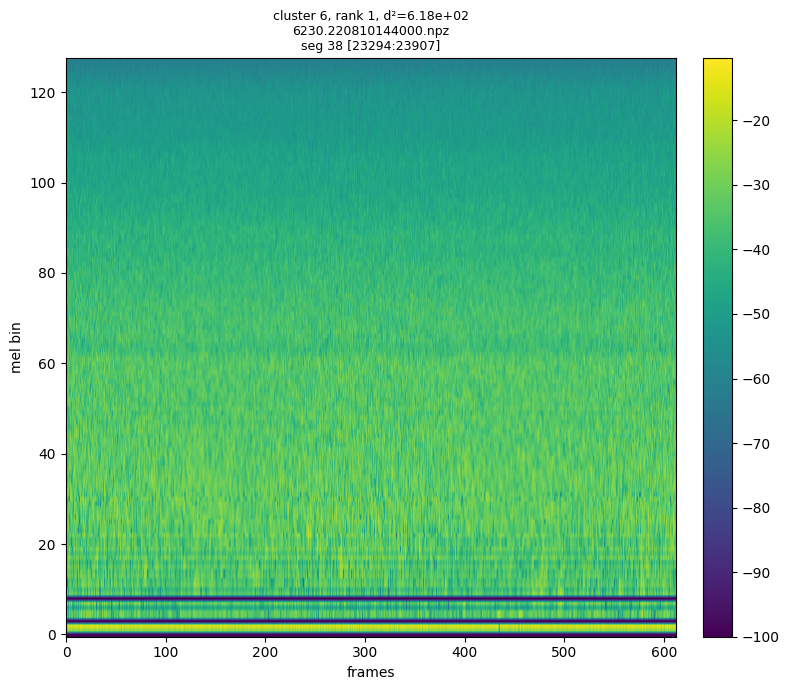

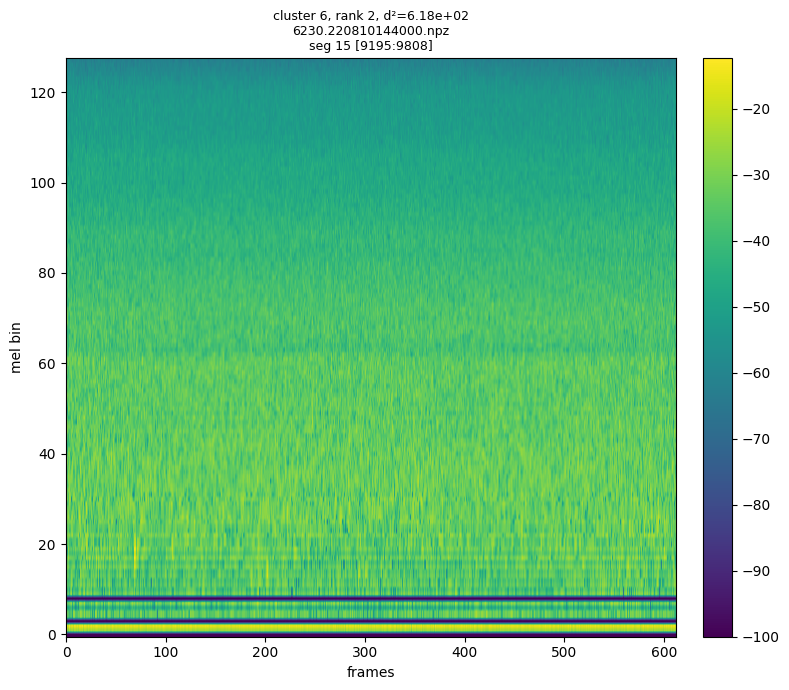

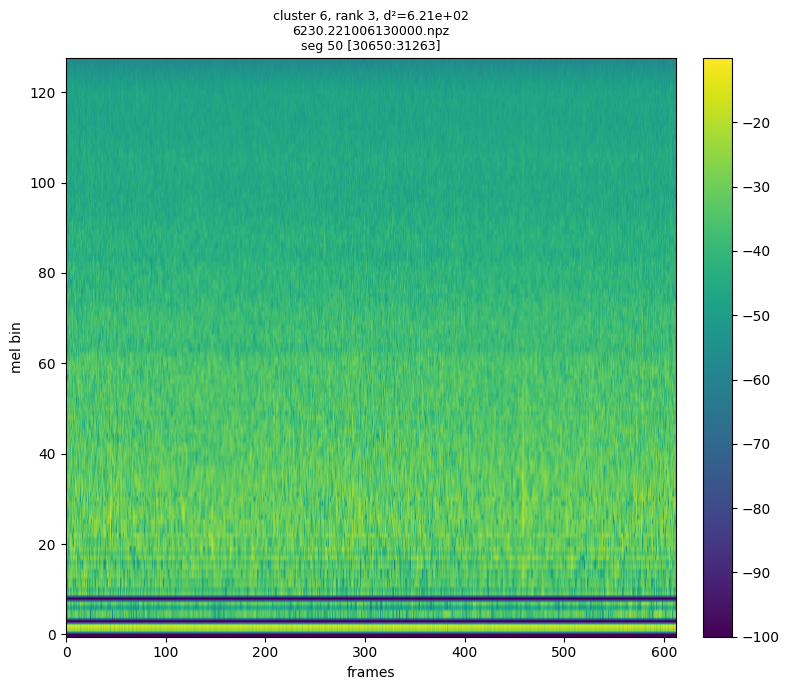

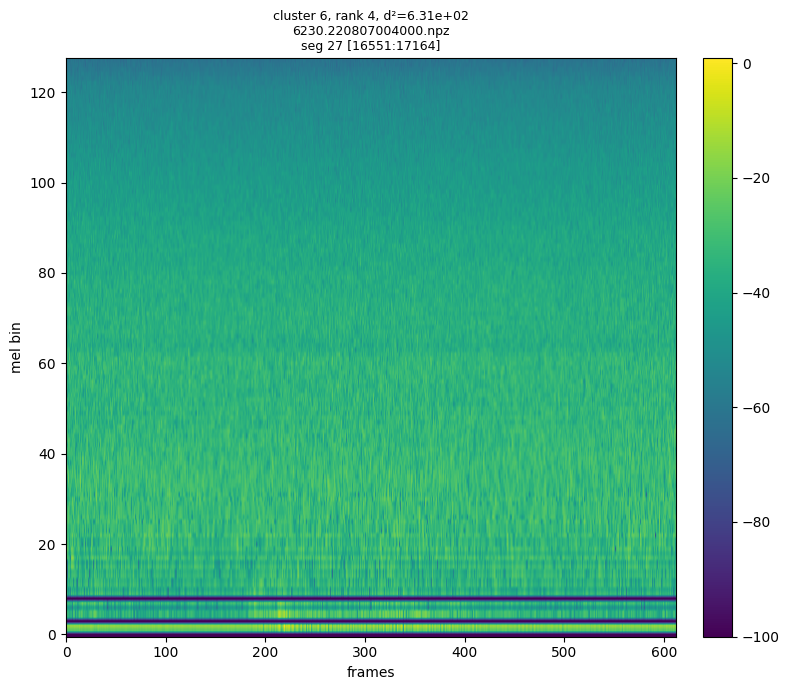

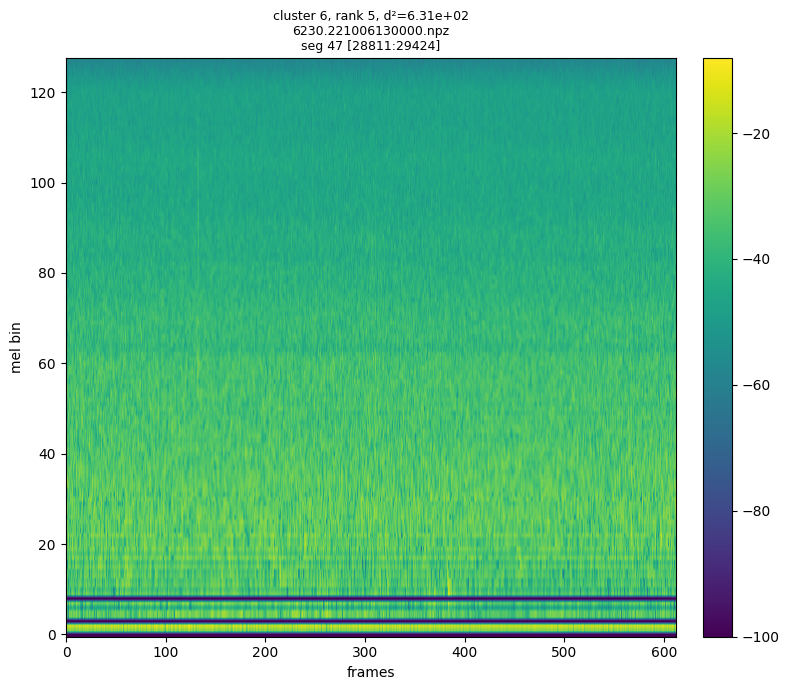

...

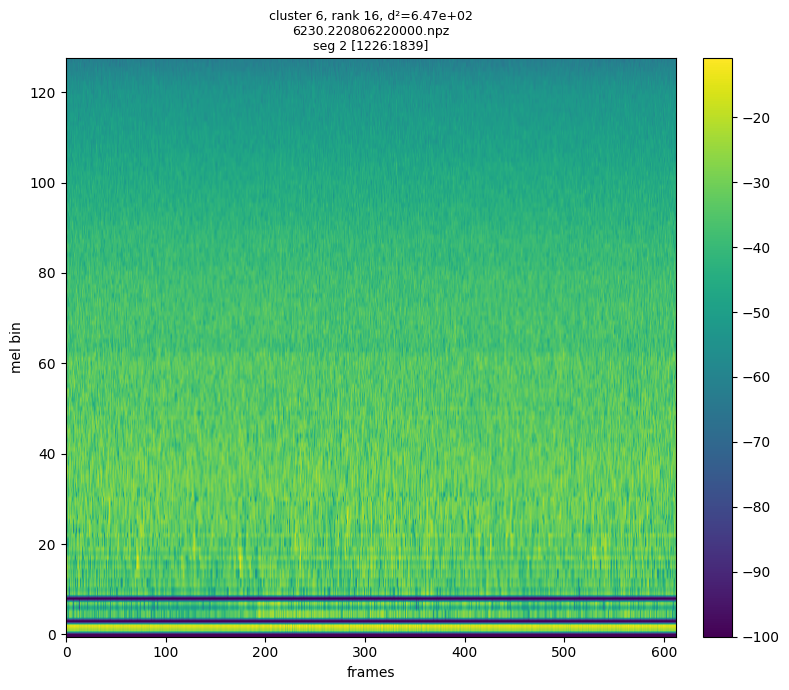

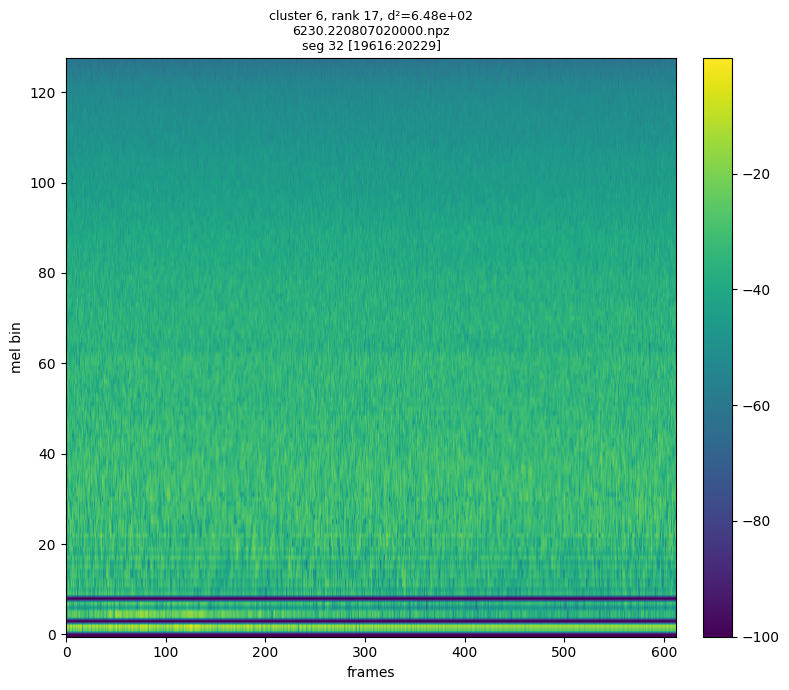

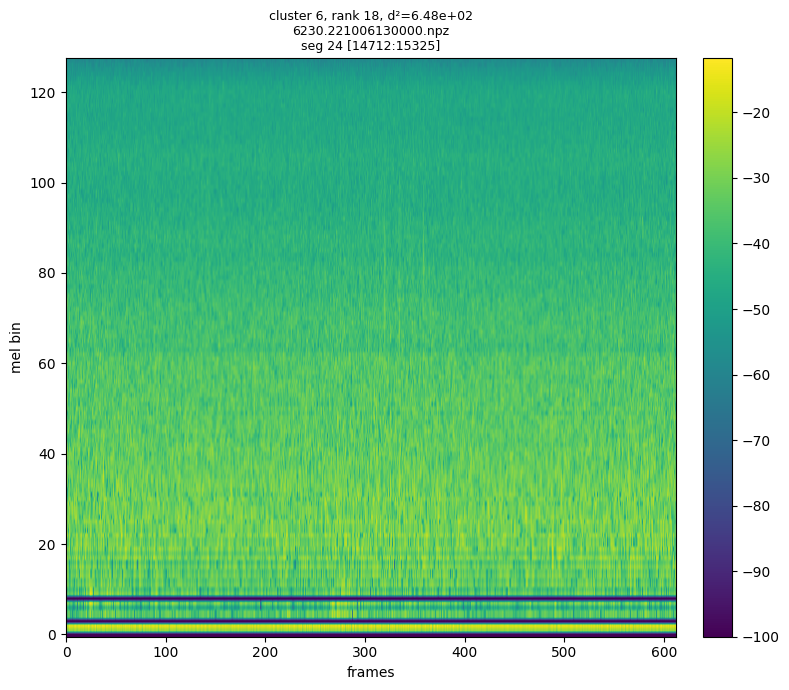

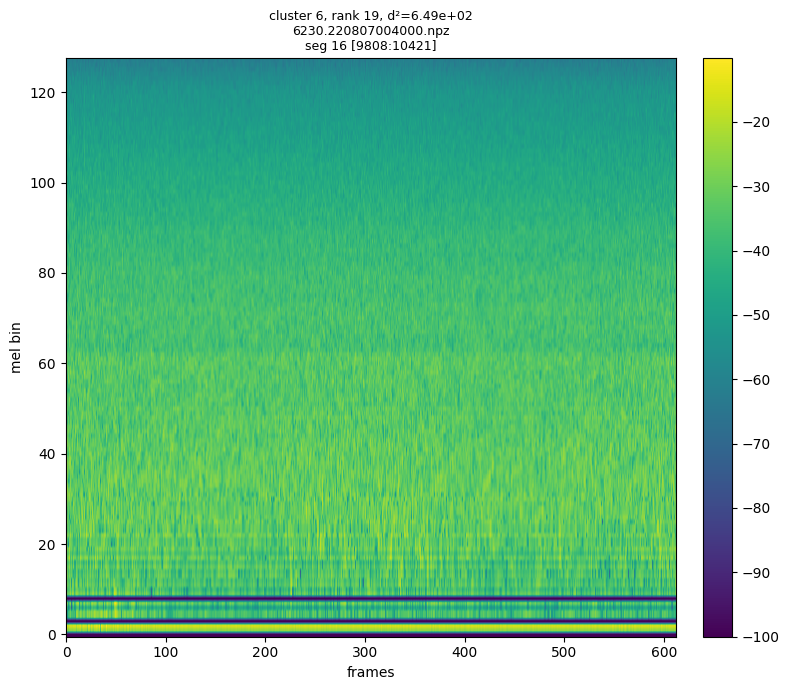

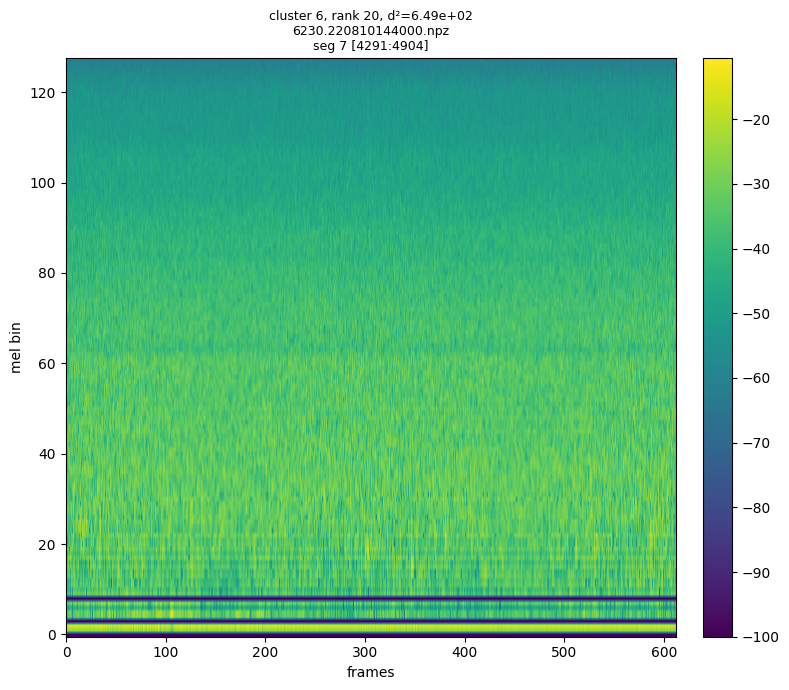

In [42]:
rows = (
    nearest_merged[nearest_merged["cluster"] == 6]
    .sort_values("rank")
    .head(20)
)
for _, row in rows.iterrows():
    plot_segment_from_row(row, DATA_ROOT)
